# **Getting root of DIAMONDS**:

In [2]:
import sys
import os


project_root = "C:/Users/Visnu/DIAMONDS"  


if project_root not in sys.path:
    sys.path.append(project_root)


from diamonds import set_data_path, load_patients
import diamonds.data as dt


# **Importing subject data**:

In [3]:
from diamonds import set_data_path, load_patients
import diamonds.data as dt
import os


data_path = "C:/Users/Visnu/OneDrive - Danmarks Tekniske Universitet/DIAMONDS - Preclinical_new"


set_data_path(data_path)

print("Dataset Path:", data_path)
print("Contents:", os.listdir(data_path)) 



Dataset Path: C:/Users/Visnu/OneDrive - Danmarks Tekniske Universitet/DIAMONDS - Preclinical_new
Contents: ['desktop.ini', 'p01', 'p02', 'p03', 'p04', 'p05', 'p06', 'p07', 'p08', 'p10', 'p11', 'p12', 'p13', 'p14', 'p15', 'p16']


# **Loading subject data**:

In [4]:
import diamonds.data as dt
import pandas as pd
import diamonds.io.io as dio

def filtered_patient_list():
    return [
        item for item in os.listdir(data_path)
        if os.path.isdir(os.path.join(data_path, item)) and not item.lower().endswith(".ini")
    ]


dio.get_patient_list = filtered_patient_list

ptt = load_patients(show_progress=True)
pt = ptt[5]




Loading patients: 100%|██████████| 15/15 [00:03<00:00,  4.95patient(s)/s]


# **Getting session and exercise annotations**:

In [5]:
session = pt[dt.SeatedSession]


exercise = session[dt.Exercise]





# **Getting isolated ECG directly**:

In [6]:

[session.append(sig) for sig in session[dt.EMG].decompose()]
ecg_iso = session[dt.ECGIsolated]
print(ecg_iso.fs)



C:\Users/Visnu/DIAMONDS\diamonds\signal_processing\decomposition\Unet.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(checkpoint_path,

1000


# **Plotting exstracted ECG signal(from given pt)**:

In [7]:
import plotly.graph_objects as go 
import plotly.express as px


fig = go.Figure()
fig.add_trace(go.Scatter(
    x=ecg_iso.samples_df["Timestamp"],
    y=-ecg_iso.samples_df["Amplitude"],
    mode='lines',
    name="ECGIsolated"
))


for i, label in enumerate(exercise.ann):
    start = exercise.timestamp[i]
    end = exercise.timestamp[i + 1] if i < len(exercise.timestamp) - 1 else ecg_iso.samples_df["Timestamp"].iloc[-1]

    
    fig.add_vrect(
        x0=start,
        x1=end,
        fillcolor="red",
        opacity=0.2,
        line_width=0,
        annotation_text=label,
        annotation_position="top left"
    )

  
    if i < len(exercise.timestamp) - 1:
        fig.add_trace(go.Scatter(
            x=[end, end],
            y=[min(ecg_iso.samples_df["Amplitude"]), max(ecg_iso.samples_df["Amplitude"])],
            mode="lines",
            line=dict(color="black", dash="solid"),
            name="Exercise Split",
            showlegend=(i == 0)
        ))

# Final layout
fig.update_layout(
    title="ECGIsolated Signal with Exercise Intervals",
    xaxis_title="Time (s)",
    yaxis_title="Amplitude",
    legend=dict(itemsizing="constant")
)
fig.update_xaxes(range=[30, 400])
fig.show()


# **Getting breath/exercise annotation and timestamps**:

In [8]:
session = pt[dt.SeatedSession]  
breaths = session[dt.Breaths]       
exercise = session[dt.Exercise]     

print(breaths.timestamp)
print(breaths.ann)
print(exercise.timestamp)
print(exercise.ann)

[61.501352673992926, 61.501352673992926, 62.081352673992924, 63.90135267399293, 65.36135267399293, 67.36135267399293, 68.92135267399293, 70.82135267399292, 72.36135267399293, 73.96135267399293, 75.38135267399292, 77.56135267399293, 79.12135267399293, 81.12135267399293, 81.96135267399293, 83.20135267399293, 84.94135267399292, 86.72135267399293, 88.08135267399292, 89.78135267399293, 91.18135267399293, 92.98135267399293, 94.86135267399293, 96.84135267399293, 98.28135267399293, 100.12135267399293, 101.46135267399293, 103.40135267399293, 104.98135267399292, 106.72135267399293, 108.16135267399292, 110.18135267399293, 111.66135267399292, 113.48135267399292, 114.90135267399293, 116.74135267399294, 118.22135267399293, 120.18135267399293, 121.90135267399293, 123.50135267399293, 125.12135267399293, 126.86135267399294, 128.4613526739929, 130.40135267399293, 132.4613526739929, 134.48135267399294, 136.04135267399295, 137.80135267399294, 139.36135267399294, 141.16135267399292, 142.70135267399291, 144

# **Defining decomposed ECG signal, sampling frequency fs and ecg time domain**:

In [9]:
import numpy as np
session_type = dt.SeatedSession  
session = pt[session_type]
        
        
EMG, ECG = pt[session_type, dt.EMG].decompose()
ecg_signal = -ECG.samples[:, 1]  
fs = ECG.fs
t2 = np.arange(0, len(ecg_signal)) / fs
print(ecg_signal)
print(type(ecg_signal))
print(np.shape(ecg_signal))

C:\Users/Visnu/DIAMONDS\diamonds\signal_processing\decomposition\Unet.py:133: FutureWarning:

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.



[ 93.44098466 121.72332712 137.28357864 ...  13.40953824   7.23437581
   2.23547422]
<class 'numpy.ndarray'>
(490000,)


In [10]:
import sys


wrong_path = "C:/Users/visnu/OneDrive - Danmarks Tekniske Universitet/Code/Visnu"
if wrong_path in sys.path:
    sys.path.remove(wrong_path)

correct_path = "C:/Users/visnu/DIAMONDS/Visnu"
if correct_path not in sys.path:
    sys.path.append(correct_path)



# **Getting preprocessed ECG signal (with R peaks) and interpolated signals**:

In [11]:
import importlib
import preprocessing
importlib.reload(preprocessing)
import preprocessing


method_choice = "pan_tompkins"   # or "engzee" 


results = preprocessing.extract_ecg_features(
    ecg_signal,
    fs,
    method=method_choice,
    RRI_fs=10,
    default_window_len=0.1,
    search_window_len=0.01,
    edr_method='R_peak'
)

filtered_ecg = ecg_signal
R_peaks       = results["R_peaks"]
RRI           = results["RRI"]
RRI_resampled = results["RRI_resampled"]
QRS_amplitude = results["QRS_amp"]
QRS_amplitude_resampled = results["QRS_amp_resampled"]
combined_time = results["combined_time"] 
combined_signal = results["combined_signal"]
combined_raw_signal = results["combined_raw_signal"]




Detected 653 R-peaks


# **Plotting the signals without bandpass**:

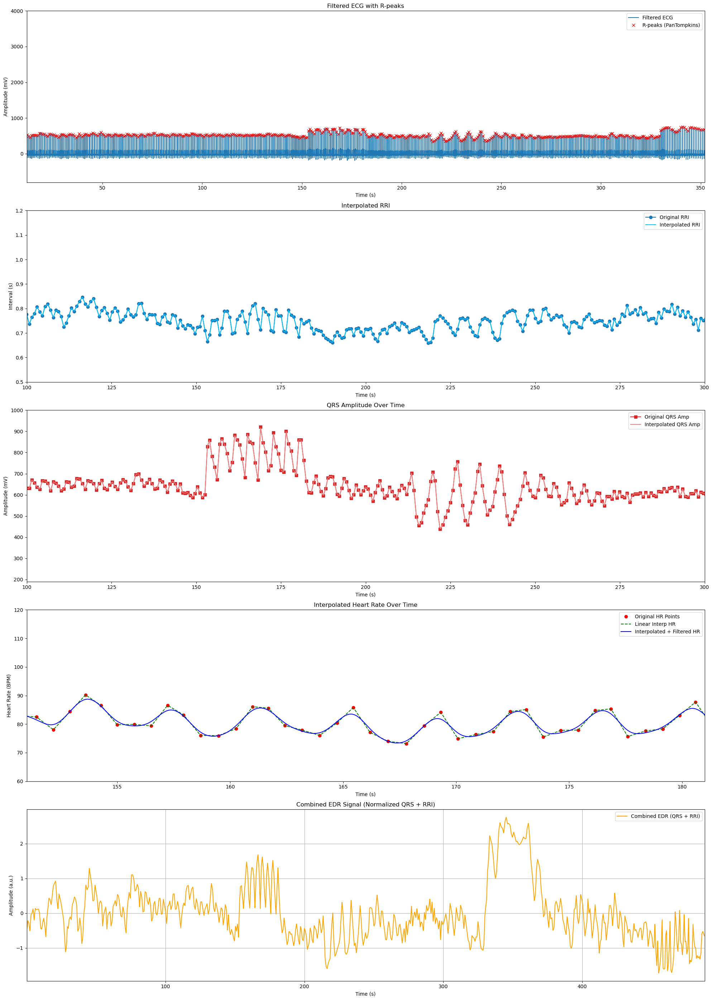

In [15]:
import importlib
import interpolated_signal_view_2
importlib.reload(interpolated_signal_view_2)
from interpolated_signal_view_2 import plot_interpolated_signals


plot_interpolated_signals(
    ecg_signal, filtered_ecg, R_peaks,
    RRI, RRI_resampled,
    QRS_amplitude, QRS_amplitude_resampled,
    fs,
    combined_time, combined_signal, combined_raw_signal,
    R_peaks_engzee=None, R_peak_new_2=None,
)

[61.501352673992926, 91.50135267399293, 121.50135267399293, 151.50135267399293, 181.50135267399293, 211.50135267399293, 241.50135267399293, 271.5013526739929, 301.5013526739929, 331.5013526739929, 361.5013526739929, 391.5013526739929, 421.5013526739929, 451.5013526739929]
['Normal', 'Nose', 'Normal', 'Deep Active Inh', 'Normal', 'Deep Active Exh', 'Normal', 'Shallow', 'Normal', 'Hold', 'Normal', 'Pursed Lips', 'Normal', 'Coughs']


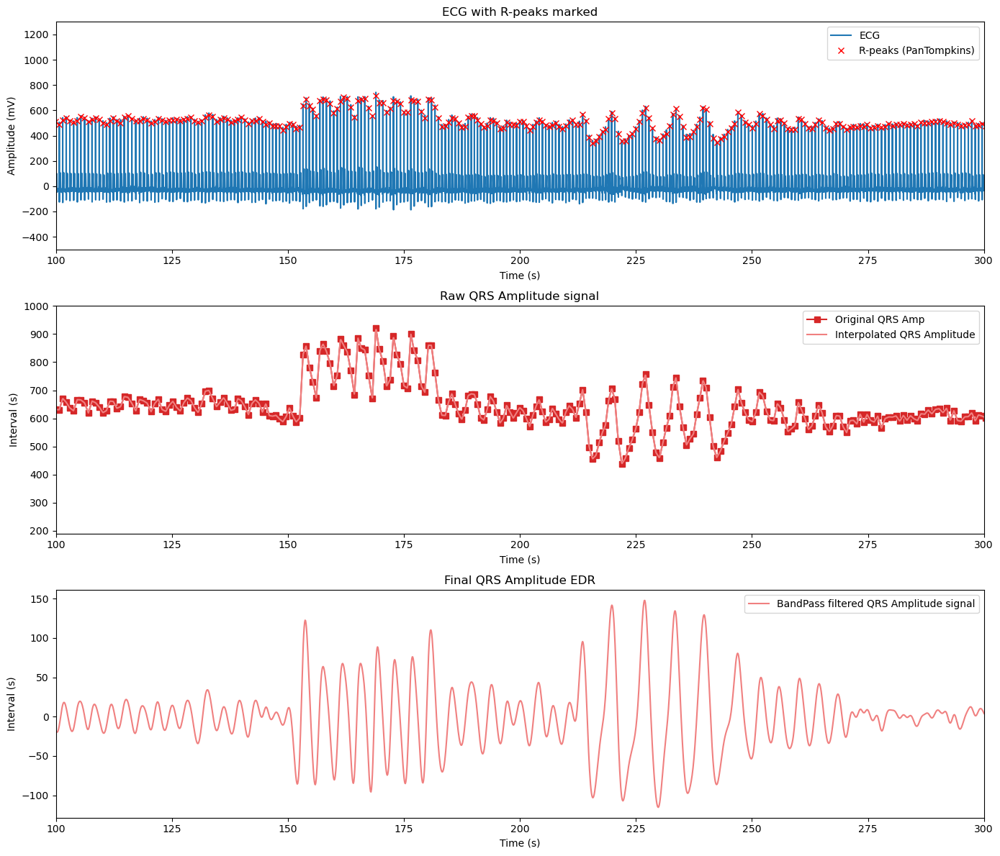

In [52]:
import matplotlib.pyplot as plt
fig, axe = plt.subplots(3, 1, figsize=(14, 12))
t2 = np.arange(0, len(ecg_signal)) / fs

# --- Panel 1: Filtered ECG & R-peaks ---
axe[0].plot(t2, filtered_ecg, label='ECG')
axe[0].plot(t2[R_peaks], filtered_ecg[R_peaks], 'rx', label='R-peaks (PanTompkins)')
axe[0].set_title('ECG with R-peaks marked')
axe[0].set_xlabel('Time (s)')
axe[0].set_ylabel('Amplitude (mV)')
axe[0].set_xlim(100, 300)
axe[0].set_ylim(-500, 1300)
axe[0].legend()

axe[1].plot(t2[R_peaks], QRS_amplitude, 's-', label='Original QRS Amp', color='tab:red')
axe[1].plot(QRS_amplitude_resampled[0], QRS_amplitude_resampled[1], label='Interpolated QRS Amplitude', color='lightcoral')
axe[1].set_title('Raw QRS Amplitude signal')
axe[1].set_xlabel('Time (s)')
axe[1].set_ylabel('Interval (s)')
axe[1].set_xlim(100, 300)
axe[1].set_ylim(190, 1000)
axe[1].legend()

axe[2].plot(QRS_amplitude_resampled[0], QRS_amplitude_resampled[2], label='BandPass filtered QRS Amplitude signal', color='lightcoral')
axe[2].set_title('Final QRS Amplitude EDR')
axe[2].set_xlabel('Time (s)')
axe[2].set_ylabel('Interval (s)')
axe[2].set_xlim(100, 300)
axe[2].legend()

print(exercise.timestamp)
print(exercise.ann)

""" # --- Panel 3: QRS Amplitude ---
axe[2].plot(t2[R_peaks], QRS_amplitude, 's-', label='Original QRS Amp', color='tab:red') """



""" # --- Panel 3: QRS Amplitude ---

axe[1].plot(QRS_amplitude_resampled[0], QRS_amplitude_resampled[2], label='Interpolated QRS Amp', color='lightcoral')

axe[1].set_title('QRS Amplitude signal')
axe[1].set_xlabel('Time (s)')
axe[1].set_ylabel('Amplitude (mV)')
axe[1].set_xlim(100, 300)
axe[1].legend()


axe[2].plot(combined_time, combined_signal, label='Combined EDR (QRS + RRI)', color='tab:green')
axe[2].set_title('Combined EDR Signal (Normalized QRS + RRI)')
axe[2].set_xlabel('Time (s)')
axe[2].set_ylabel('Amplitude (a.u.)')
axe[2].set_xlim(100, 300)
axe[2].legend()
axe[2].grid(True)
 """


plt.tight_layout()
plt.show()




# 

# **Plotting golden analysis plots**:

Exercise interval: 61.5s to 481.5s

=== Running Golden Breath Analysis ===


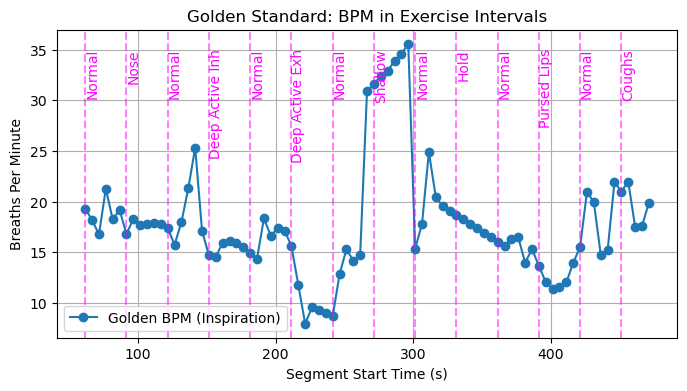

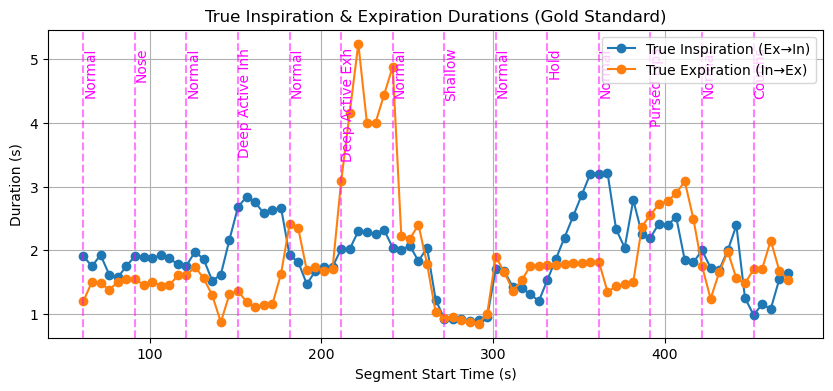

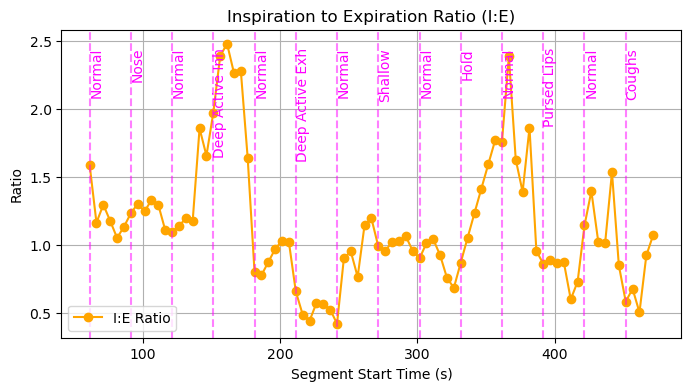


=== Segment-wise Duration Summary ===
[62-72s] Insp=1.91s, Exp=1.20s, I:E=1.59
[67-77s] Insp=1.75s, Exp=1.51s, I:E=1.16
[72-82s] Insp=1.93s, Exp=1.49s, I:E=1.29
[77-87s] Insp=1.62s, Exp=1.38s, I:E=1.17
[82-92s] Insp=1.57s, Exp=1.50s, I:E=1.05
[87-97s] Insp=1.75s, Exp=1.55s, I:E=1.13
[92-102s] Insp=1.91s, Exp=1.55s, I:E=1.23
[97-107s] Insp=1.89s, Exp=1.45s, I:E=1.30
[102-112s] Insp=1.88s, Exp=1.51s, I:E=1.25
[107-117s] Insp=1.92s, Exp=1.45s, I:E=1.33
[112-122s] Insp=1.87s, Exp=1.45s, I:E=1.29
[117-127s] Insp=1.78s, Exp=1.61s, I:E=1.11
[122-132s] Insp=1.76s, Exp=1.61s, I:E=1.09
[127-137s] Insp=1.98s, Exp=1.74s, I:E=1.14
[132-142s] Insp=1.86s, Exp=1.56s, I:E=1.19
[137-147s] Insp=1.52s, Exp=1.29s, I:E=1.18
[142-152s] Insp=1.62s, Exp=0.87s, I:E=1.85
[147-157s] Insp=2.17s, Exp=1.31s, I:E=1.65
[152-162s] Insp=2.68s, Exp=1.36s, I:E=1.97
[157-167s] Insp=2.84s, Exp=1.19s, I:E=2.39
[162-172s] Insp=2.75s, Exp=1.11s, I:E=2.48
[167-177s] Insp=2.58s, Exp=1.14s, I:E=2.26
[172-182s] Insp=2.63s, Exp=1.

In [ ]:
import importlib
import golden_analysis
importlib.reload(golden_analysis)

from golden_analysis import GoldenBreathAnalyzer
session_types = [dt.SeatedSession, dt.SupineSession]


analyzer = GoldenBreathAnalyzer(pt, interval_size=10, step_len=5)
analyzer.run_analysis()




# **Making table for spirotromy data**:

In [20]:
import golden_analysis
import importlib
importlib.reload(golden_analysis)
from golden_analysis import GoldenBreathAnalyzer
import diamonds.data as dt
from diamonds import load_patients
import pandas as pd
import shutil
import os

ptt = load_patients(show_progress=True)
session_types = [dt.SeatedSession, dt.SupineSession]

golden_list = []

for pt in ptt:
    for sess_type in session_types:
        try:
            _ = pt[sess_type]  
        except KeyError:
            continue

        try:
            analyzer = GoldenBreathAnalyzer(pt, session_type=sess_type,
                                            interval_size=10, step_len=5)
            golden_df = analyzer.build_golden_table()
            golden_df['session_type'] = sess_type.__name__  
            golden_df['subject_id']   = pt.id
            golden_list.append(golden_df)
        except Exception as e:
            print(f"Failed for {pt.id}, {sess_type.__name__}: {e}")

if golden_list:
    combined_golden_df = pd.concat(golden_list, ignore_index=True)
    output_file = "spirotromy_breath_merics_dataset.xlsx"
    

    combined_golden_df.to_excel(output_file, index=False)
    print(f"Saved gold data to '{output_file}'")

    destination_folder = r"C:/Users/visnu/DIAMONDS/Thesis code/Datafiles"
    os.makedirs(destination_folder, exist_ok=True)  # Ensure folder exists
    shutil.move(output_file, os.path.join(destination_folder, output_file))

    print(f"Moved '{output_file}' to '{destination_folder}' successfully!")


Loading patients: 100%|██████████| 15/15 [00:00<00:00, 18.23patient(s)/s]


Exercise interval: 20.9s to 440.9s
Exercise interval: 18.1s to 438.1s
Exercise interval: 22.8s to 382.8s
Exercise interval: 24.5s to 384.5s
Exercise interval: 20.9s to 380.9s
Exercise interval: 27.1s to 387.1s
Exercise interval: 59.5s to 479.5s
Exercise interval: 51.1s to 471.1s
Exercise interval: 29.5s to 449.5s
Exercise interval: 17.3s to 437.3s
Exercise interval: 61.5s to 481.5s
Exercise interval: 398.2s to 818.2s
Exercise interval: 21.7s to 441.7s
Exercise interval: 11.9s to 431.9s
Exercise interval: 142.2s to 562.2s
Exercise interval: 83.4s to 503.4s
Exercise interval: 31.5s to 451.5s
Exercise interval: 25.8s to 445.8s
Exercise interval: 45.2s to 465.2s
Exercise interval: 23.2s to 443.2s
Exercise interval: 146.9s to 566.9s
Exercise interval: 44.7s to 464.7s
Exercise interval: 69.4s to 489.4s
Exercise interval: 21.3s to 441.3s
Exercise interval: 45.5s to 465.5s
Exercise interval: 11.8s to 431.8s
Exercise interval: 33.1s to 453.1s
Exercise interval: 39.2s to 459.2s
Exercise interval

# **First Feature dataframe breath_detection**:

In [ ]:
import importlib
from Breath_Segmentation import breath_detection
from Breath_Segmentation import features_3
importlib.reload(features_3)
from Breath_Segmentation.features_3 import build_feature_table

ptt = load_patients(show_progress=True)


session_types = [dt.SeatedSession, dt.SupineSession]

feature_list = []

for pt in ptt:
    print(f"processing subject: {pt.id}")
    for sess_type in session_types:
        try:
            
            session = pt[sess_type]
        except KeyError:
            print(f"  subject {pt.id} does not have session type {sess_type.__name__}")
            continue

        try:
           
            EMG, ECG = pt[(sess_type, dt.EMG)].decompose()
            ecg_signal = -ECG.samples[:, 1]
            fs = ECG.fs

            
            filtered_ecg = ecg_signal
            R_peaks, RRI, RRI_resampled = preprocessing.get_RRI_from_signal(filtered_ecg, fs)
            QRS_amplitude, QRS_amplitude_resampled = preprocessing.get_QRS_amplitude(
                filtered_ecg, R_peaks, fs, default_window_len=0.1
            )

            _df = build_feature_table(
                patient=pt,
                session=session,
                ecg_signal=filtered_ecg,
                fs=fs,
                QRS_amplitude_resampled=QRS_amplitude_resampled,
                interval_size=10,
                step_len = 5
            )
            
            _df['session_type'] = sess_type.__name__
            feature_list.append(_df)
            print(f"  processed {sess_type.__name__} for subject {pt.id} with DataFrame shape {_df.shape}")
        except Exception as e:
            print(f" failed for subject {pt.id} for session {sess_type.__name__}: {e}")

import os

if feature_list:
    features_df = pd.concat(feature_list, ignore_index=True)
    print("Combined feature dataframe:")
    print(features_df)

 
    destination_folder = r"C:/Users/visnu/DIAMONDS/Thesis code/Datafiles"
    os.makedirs(destination_folder, exist_ok=True)  # Ensure folder exists

  
    output_file = os.path.join(destination_folder, "breath_merics_dataset_QRS_without_exercise.xlsx")
    features_df.to_excel(output_file, index=False)

    print(f"Saved feature data to '{output_file}'")
else:
    print("No feature data was generated!")



# Making merged data file: when holding breath is sat to zero on the golden signal:

In [ ]:
import numpy as np
import pandas as pd
from diamonds import load_patients
import diamonds.data as dt


df_edr  = pd.read_excel("C:/Users/visnu/DIAMONDS/Thesis code/Datafiles/breath_metrics_dataset_QRS_without_exercise.xlsx")
df_gold = pd.read_excel("C:/Users/visnu/DIAMONDS/Thesis code/Datafiles/spirotromy_breath_merics_dataset.xlsx")


key_cols = ["subject_id", "session_type", "window_start", "window_end"]
df = (pd.merge(df_edr, df_gold, on=key_cols, how="inner")
        .sort_values(key_cols)
        .reset_index(drop=True))


patients = {p.id: p for p in load_patients(show_progress=True)}

def add_exercise(win_df: pd.DataFrame, ex_obj) -> pd.DataFrame:
    ex_df = pd.DataFrame({
        "ex_ts":   np.asarray(ex_obj.timestamp, dtype=float), 
        "exercise": ex_obj.ann
    }).sort_values("ex_ts")

    win_df = win_df.copy()
    win_df["mid_time"] = (win_df["window_start"] + win_df["window_end"]) / 2

    return (pd.merge_asof(win_df.sort_values("mid_time"),
                          ex_df,
                          left_on="mid_time", right_on="ex_ts",
                          direction="backward")
              .drop(columns=["ex_ts", "mid_time"]))

frames = []
for (sid, sess), grp in df.groupby(["subject_id", "session_type"], sort=False):
    ex_obj = patients[sid][getattr(dt, sess)][dt.Exercise]
    frames.append(add_exercise(grp, ex_obj))

df_final = pd.concat(frames, ignore_index=True)
print("with exercise column:", df_final.shape, df_final["exercise"].unique())

hold_mask = df_final["exercise"].str.lower().eq("hold")
gold_cols = [c for c in df_final.columns if c.startswith("gold_")]
df_final.loc[hold_mask, gold_cols] = 0

import os


DATAFILES_FOLDER = r"C:\Users\visnu\DIAMONDS\Thesis code\Datafiles"
os.makedirs(DATAFILES_FOLDER, exist_ok=True)  


output_file = os.path.join(DATAFILES_FOLDER, "breath_merics_dataset_QRS_with_exercise_hold_golden.xlsx")
df_final.to_excel(output_file, index=False)

print(f"✅ Written → {output_file}")


Loading patients: 100%|██████████| 15/15 [00:00<00:00, 47.98patient(s)/s]


with exercise column: (2442, 17) ['Normal' 'Nose' 'Deep Active Inh' 'Deep Active Exh' 'Shallow' 'Hold'
 'Pursed Lips' 'Coughs']
✅ Written → C:\Users\visnu\DIAMONDS\Thesis code\Datafiles\breath_merics_dataset_QRS_with_exercise_hold_golden.xlsx


# Making merged data file: When holding breath exercises are sat to zero on both calculated and golden:

In [ ]:
import numpy as np
import pandas as pd
from diamonds import load_patients
import diamonds.data as dt


df_edr  = pd.read_excel("C:/Users/visnu/DIAMONDS/Thesis code/Datafiles/breath_metrics_dataset_QRS_without_exercise.xlsx")
df_gold = pd.read_excel("C:/Users/visnu/DIAMONDS/Thesis code/Datafiles/spirotromy_breath_merics_dataset.xlsx")


key_cols = ["subject_id", "session_type", "window_start", "window_end"]
df = (pd.merge(df_edr, df_gold, on=key_cols, how="inner")
        .sort_values(key_cols)
        .reset_index(drop=True))


patients = {p.id: p for p in load_patients(show_progress=True)}

def add_exercise(win_df: pd.DataFrame, ex_obj) -> pd.DataFrame:
    ex_df = pd.DataFrame({
        "ex_ts":   np.asarray(ex_obj.timestamp, dtype=float),  
        "exercise": ex_obj.ann
    }).sort_values("ex_ts")

    win_df = win_df.copy()
    win_df["mid_time"] = (win_df["window_start"] + win_df["window_end"]) / 2

    return (pd.merge_asof(win_df.sort_values("mid_time"),
                          ex_df,
                          left_on="mid_time", right_on="ex_ts",
                          direction="backward")
              .drop(columns=["ex_ts", "mid_time"]))

frames = []
for (sid, sess), grp in df.groupby(["subject_id", "session_type"], sort=False):
    ex_obj = patients[sid][getattr(dt, sess)][dt.Exercise]
    frames.append(add_exercise(grp, ex_obj))

df_merged = pd.concat(frames, ignore_index=True)
print("with exercise column:", df_merged.shape, df_merged["exercise"].unique())


hold_mask = df_merged["exercise"].str.lower().eq("hold")

gold_cols = [c for c in df_merged.columns if c.startswith("gold_")]
df_merged.loc[hold_mask, gold_cols] = 0

edr_cols = ["EDR_BPM", "n_breaths", "AvgTotalBreathDuration",
            "TrueInspDuration", "TrueExpDuration", "IEratio"]
df_merged.loc[hold_mask, edr_cols] = 0

import os


DATAFILES_FOLDER = r"C:\Users\visnu\DIAMONDS\Thesis code\Datafiles"
os.makedirs(DATAFILES_FOLDER, exist_ok=True)  


output_file = os.path.join(DATAFILES_FOLDER, "breath_merics_dataset_QRS_with_exercise_hold_both.xlsx")
df_merged.to_excel(output_file, index=False)

print(f"✅ Written → {output_file}")

Loading patients: 100%|██████████| 15/15 [00:00<00:00, 46.33patient(s)/s]


with exercise column: (2442, 17) ['Normal' 'Nose' 'Deep Active Inh' 'Deep Active Exh' 'Shallow' 'Hold'
 'Pursed Lips' 'Coughs']
✅ Written → C:\Users\visnu\DIAMONDS\Thesis code\Datafiles\breath_merics_dataset_QRS_with_exercise_hold_both.xlsx


In [ ]:
import importlib
import os
import pandas as pd

# --- Replace segmentation module with your classification one ---
import importlib
from R_peak_detection import pan_tompkins
importlib.reload(pan_tompkins)
from R_peak_detection.pan_tompkins import detect_ecg_peaks
from R_peak_detection.engzee_tompkins import detect_ecg_peaks_engzee
from R_peak_detection.new_rpeak_detector import detect_r_peaks as neurokit_detect


import importlib
from Breath_Segmentation import breath_detection
importlib.reload(breath_detection)
from Breath_Segmentation.breath_detection import (
    auto_detect_edr_breaths,
    define_breaths_insp_exp,
    define_complete_breath_cycles,
    compute_true_insp_exp_durations,
    DEFAULT_MIN_BREATH_SEC
)
from diamonds_definitions import pt, session, exercise, ecg_signal, fs
import pandas as pd
import diamonds.data as dt
from diamonds import load_patients
import preprocessing
importlib.reload(preprocessing)

# --- Load your patients (same as before) ---
ptt = load_patients(show_progress=True)


session_types = [dt.SeatedSession, dt.SupineSession]

feature_list = []

for pt in ptt:
    print(f"processing subject: {pt.id}")
    for sess_type in session_types:
        try:
            
            session = pt[sess_type]
        except KeyError:
            print(f"  subject {pt.id} does not have session type {sess_type.__name__}")
            continue

        try:
           
            EMG, ECG = pt[(sess_type, dt.EMG)].decompose()
            ecg_signal = -ECG.samples[:, 1]
            fs = ECG.fs

            
            filtered_ecg = ecg_signal
            R_peaks, RRI, RRI_resampled = preprocessing.get_RRI_from_signal(filtered_ecg, fs)
            QRS_amplitude, QRS_amplitude_resampled = preprocessing.get_QRS_amplitude(
                filtered_ecg, R_peaks, fs, default_window_len=0.1
            )

            _df = build_feature_table(
            pt, session,
            filtered_ecg,           
            R_peaks,                 
            fs,
            QRS_amplitude_resampled,       
            interval_size=10, step_len=5
            )

            
            _df['session_type'] = sess_type.__name__
            feature_list.append(_df)
            print(f"  processed {sess_type.__name__} for subject {pt.id} with DataFrame shape {_df.shape}")
        except Exception as e:
            print(f" failed for subject {pt.id} for session {sess_type.__name__}: {e}")


if feature_list:
    features_df = pd.concat(feature_list, ignore_index=True)
    print("Combined feature dataframe:")
    print(features_df)

    dest = r"C:/Users/visnu/DIAMONDS/Thesis code/Datafiles"
    os.makedirs(dest, exist_ok=True)

    out_file = os.path.join(dest, "breath_classification_features_without_exercise.xlsx")
    features_df.to_excel(out_file, index=False)
    print(f"Saved feature data to '{out_file}'")
else:
    print("No feature data was generated!")


# **Making classification feature table:**

In [ ]:
import numpy as np
import pandas as pd
from diamonds import load_patients
import diamonds.data as dt



df_edr = pd.read_excel(
    "breath_classification_features_without_exercise_2.xlsx"
)


patients = {p.id: p for p in load_patients(show_progress=True)}

def add_exercise(win_df: pd.DataFrame, ex_obj) -> pd.DataFrame:

    ex_df = pd.DataFrame({
        "ex_ts":    np.asarray(ex_obj.timestamp, dtype=float),
        "exercise": ex_obj.ann
    }).sort_values("ex_ts")


    win_df = win_df.copy()
    win_df["mid_time"] = (win_df["window_start"] + win_df["window_end"]) / 2


    out = pd.merge_asof(
        win_df.sort_values("mid_time"),
        ex_df,
        left_on="mid_time", right_on="ex_ts",
        direction="backward"
    )
    return out.drop(columns=["ex_ts", "mid_time"])

frames = []
for (sid, sess), grp in df_edr.groupby(["subject_id", "session_type"], sort=False):
    ex_obj = patients[sid][getattr(dt, sess)][dt.Exercise]
    frames.append(add_exercise(grp, ex_obj))

df_final = pd.concat(frames, ignore_index=True)
print("Final shape with exercise column:", df_final.shape)
print("Exercise labels present:", df_final["exercise"].unique())


import os

DATAFILES_FOLDER = r"C:\Users\visnu\DIAMONDS\Thesis code\Datafiles"
os.makedirs(DATAFILES_FOLDER, exist_ok=True) 


output_file1 = os.path.join(DATAFILES_FOLDER, "final_dataset_for_classification.xlsx")
df_final.to_excel(output_file1, index=False)
print(f"✅ Written → {output_file1}")



Loading patients: 100%|██████████| 15/15 [00:00<00:00, 55.63patient(s)/s]


Final shape with exercise column: (2442, 21)
Exercise labels present: ['Normal' 'Nose' 'Deep Active Inh' 'Deep Active Exh' 'Shallow' 'Hold'
 'Pursed Lips' 'Coughs']
✅ Written → C:\Users\visnu\DIAMONDS\Thesis code\Datafiles\final_dataset_for_classification.xlsx
